***Group 16***<br>
**William (Billy) Edwards**<br>
**Samihan Jawalkar**<br>
**Shubham Shah**<br>
**Reetesh Zope**

#Tasks

Through this notebook we will first clean the data to ensure any modeling can be performed on the data. This includes handling missing and null values, dropping outliers, and standardizing the data. After this part, we will go through exploratory data analysis to look for relationships amongst the variables. We will utilize box plots, scatter plot matrices, histogram matrices, and heat maps to look at these relationships. In particular, we will try to see if increasing humidity, precipitation, air temperature, and vegetation index is more likely to predict an increas in the the total Dengue cases for each (city, year, and weekofyear). 

#Dataset

The features in this dataset

We are provided the following set of information on a (year, weekofyear) timescale:

(Where appropriate, units are provided as a _unit suffix on the feature name.)
City and date indicators

    city – City abbreviations: sj for San Juan and iq for Iquitos
    week_start_date – Date given in yyyy-mm-dd format

NOAA's GHCN daily climate data weather station measurements

    station_max_temp_c – Maximum temperature
    station_min_temp_c – Minimum temperature
    station_avg_temp_c – Average temperature
    station_precip_mm – Total precipitation
    station_diur_temp_rng_c – Diurnal temperature range

PERSIANN satellite precipitation measurements (0.25x0.25 degree scale)

    precipitation_amt_mm – Total precipitation

NOAA's NCEP Climate Forecast System Reanalysis measurements (0.5x0.5 degree scale)

    reanalysis_sat_precip_amt_mm – Total precipitation
    reanalysis_dew_point_temp_k – Mean dew point temperature
    reanalysis_air_temp_k – Mean air temperature
    reanalysis_relative_humidity_percent – Mean relative humidity
    reanalysis_specific_humidity_g_per_kg – Mean specific humidity
    reanalysis_precip_amt_kg_per_m2 – Total precipitation
    reanalysis_max_air_temp_k – Maximum air temperature
    reanalysis_min_air_temp_k – Minimum air temperature
    reanalysis_avg_temp_k – Average air temperature
    reanalysis_tdtr_k – Diurnal temperature range

Satellite vegetation - Normalized difference vegetation index (NDVI) - NOAA's CDR Normalized Difference Vegetation Index (0.5x0.5 degree scale) measurements

    ndvi_se – Pixel southeast of city centroid
    ndvi_sw – Pixel southwest of city centroid
    ndvi_ne – Pixel northeast of city centroid
    ndvi_nw – Pixel northwest of city centroid


#Data Cleaning

In [ ]:
#importing libraries
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
from pandas.plotting import scatter_matrix
from scipy.stats import zscore
import scipy
import numpy as np
from scipy.cluster import hierarchy as sch

In [ ]:
#reading the file
df = pd.read_csv('dengue_features_train.csv')

In [ ]:
#looking through the data
df.head()

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
0,sj,1990,18,4/30/1990,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,297.742857,292.414286,299.8,295.9,32.00,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0,4
1,sj,1990,19,5/7/1990,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,298.442857,293.951429,300.9,296.4,17.94,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6,5
2,sj,1990,20,5/14/1990,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,298.878571,295.434286,300.5,297.3,26.10,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4,4
3,sj,1990,21,5/21/1990,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,299.228571,295.310000,301.4,297.0,13.90,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0,3
4,sj,1990,22,5/28/1990,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,299.664286,295.821429,301.9,297.5,12.20,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8,6


In [ ]:
#descirbing the statistical information of data
df.describe()

,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
count,1456.000000,1456.000000,1262.000000,1404.000000,1434.000000,1434.000000,1443.000000,1446.000000,1446.000000,1446.000000,1446.000000,1446.000000,1446.000000,1446.000000,1443.000000,1446.000000,1446.000000,1413.000000,1413.000000,1436.000000,1442.000000,1434.000000,1456.000000
mean,2001.031593,26.503434,0.142294,0.130553,0.203783,0.202305,45.760388,298.701852,299.225578,295.246356,303.427109,295.719156,40.151819,82.161959,45.760388,16.746427,4.903754,27.185783,8.059328,32.452437,22.102150,39.326360,24.675137
std,5.408314,15.019437,0.140531,0.119999,0.073860,0.083903,43.715537,1.362420,1.261715,1.527810,3.234601,2.565364,43.434399,7.153897,43.715537,1.542494,3.546445,1.292347,2.128568,1.959318,1.574066,47.455314,43.596000
min,1990.000000,1.000000,-0.406250,-0.456100,-0.015533,-0.063457,0.000000,294.635714,294.892857,289.642857,297.800000,286.900000,0.000000,57.787143,0.000000,11.715714,1.357143,21.400000,4.528571,26.700000,14.700000,0.000000,0.000000
25%,1997.000000,13.750000,0.044950,0.049217,0.155087,0.144209,9.800000,297.658929,298.257143,294.118929,301.000000,293.900000,13.055000,77.177143,9.800000,15.557143,2.328571,26.300000,6.514286,31.100000,21.100000,8.700000,5.000000
50%,2002.000000,26.500000,0.128817,0.121429,0.196050,0.189450,38.340000,298.646429,299.289286,295.640714,302.400000,296.200000,27.245000,80.301429,38.340000,17.087143,2.857143,27.414286,7.300000,32.800000,22.200000,23.850000,12.000000
75%,2005.000000,39.250000,0.248483,0.216600,0.248846,0.246982,70.235000,299.833571,300.207143,296.460000,305.500000,297.900000,52.200000,86.357857,70.235000,17.978214,7.625000,28.157143,9.566667,33.900000,23.300000,53.900000,28.000000
max,2010.000000,53.000000,0.508357,0.454429,0.538314,0.546017,390.600000,302.200000,302.928571,298.450000,314.000000,299.900000,570.500000,98.610000,390.600000,20.461429,16.028571,30.800000,15.800000,42.200000,25.600000,543.300000,461.000000


Here we can get our first overview of our features. It is clear from the count values that several have missing data which we will later impute. It's also relevant to note the scales of some of the features are quite differnet such as the mean diurnal temperature range "reanalysis_tdtr_k" (4.9) versus the total precipitation amount "reanalysis_sat_precip_amt_mm" (45.76). These features will need to be standardized to avoid skewing predictions. 

In [ ]:
#getting info of all the columns
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1456 entries, 0 to 1455
Data columns (total 25 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   city                                   1456 non-null   object 
 1   year                                   1456 non-null   int64  
 2   weekofyear                             1456 non-null   int64  
 3   week_start_date                        1456 non-null   object 
 4   ndvi_ne                                1262 non-null   float64
 5   ndvi_nw                                1404 non-null   float64
 6   ndvi_se                                1434 non-null   float64
 7   ndvi_sw                                1434 non-null   float64
 8   precipitation_amt_mm                   1443 non-null   float64
 9   reanalysis_air_temp_k                  1446 non-null   float64
 10  reanalysis_avg_temp_k                  1446 non-null   float64
 11  rean

From the output we see three different data types, of which only two are non-numerical. Both "city" and "week_start_date" are listed as objects. The city feature will be converted to a categorical variable, while "week_start_date" will be converted to date time. There are also 25 columns in the dataset and 1,456 rows of data. 

In [ ]:
#checking number of rows and columns
df.shape

(1456, 25)

In [ ]:
#percentage of null values
df.isnull().sum() * 100 / len(df)


city                                      0.000000
year                                      0.000000
weekofyear                                0.000000
week_start_date                           0.000000
ndvi_ne                                  13.324176
ndvi_nw                                   3.571429
ndvi_se                                   1.510989
ndvi_sw                                   1.510989
precipitation_amt_mm                      0.892857
reanalysis_air_temp_k                     0.686813
reanalysis_avg_temp_k                     0.686813
reanalysis_dew_point_temp_k               0.686813
reanalysis_max_air_temp_k                 0.686813
reanalysis_min_air_temp_k                 0.686813
reanalysis_precip_amt_kg_per_m2           0.686813
reanalysis_relative_humidity_percent      0.686813
reanalysis_sat_precip_amt_mm              0.892857
reanalysis_specific_humidity_g_per_kg     0.686813
reanalysis_tdtr_k                         0.686813
station_avg_temp_c             

Listed above, we see that all but five of the variables have missing data. Since the data missing is under 50%, we will impute the values based on the median of the variable. The median was chosen since most of the variable have outliers and imputing on the mean would capture more of that skewness in the data. 

In [ ]:
#imputing median for null values
for i,colname in enumerate(list(df.columns)):
  if df[colname].isnull().sum() * 100 / len(df):
    df[colname].fillna(df[colname].median(), inplace=True)

df.isnull().sum() * 100 / len(df)

city                                     0.0
year                                     0.0
weekofyear                               0.0
week_start_date                          0.0
ndvi_ne                                  0.0
ndvi_nw                                  0.0
ndvi_se                                  0.0
ndvi_sw                                  0.0
precipitation_amt_mm                     0.0
reanalysis_air_temp_k                    0.0
reanalysis_avg_temp_k                    0.0
reanalysis_dew_point_temp_k              0.0
reanalysis_max_air_temp_k                0.0
reanalysis_min_air_temp_k                0.0
reanalysis_precip_amt_kg_per_m2          0.0
reanalysis_relative_humidity_percent     0.0
reanalysis_sat_precip_amt_mm             0.0
reanalysis_specific_humidity_g_per_kg    0.0
reanalysis_tdtr_k                        0.0
station_avg_temp_c                       0.0
station_diur_temp_rng_c                  0.0
station_max_temp_c                       0.0
station_mi

In [ ]:
#converting city into categorical varible using label encoding
label_encoder = LabelEncoder()
df['city'] = label_encoder.fit_transform(df['city'])

In [ ]:
df['city']

0       1
1       1
2       1
3       1
4       1
       ..
1451    0
1452    0
1453    0
1454    0
1455    0
Name: city, Length: 1456, dtype: int64

#Exploratory Data Analysis

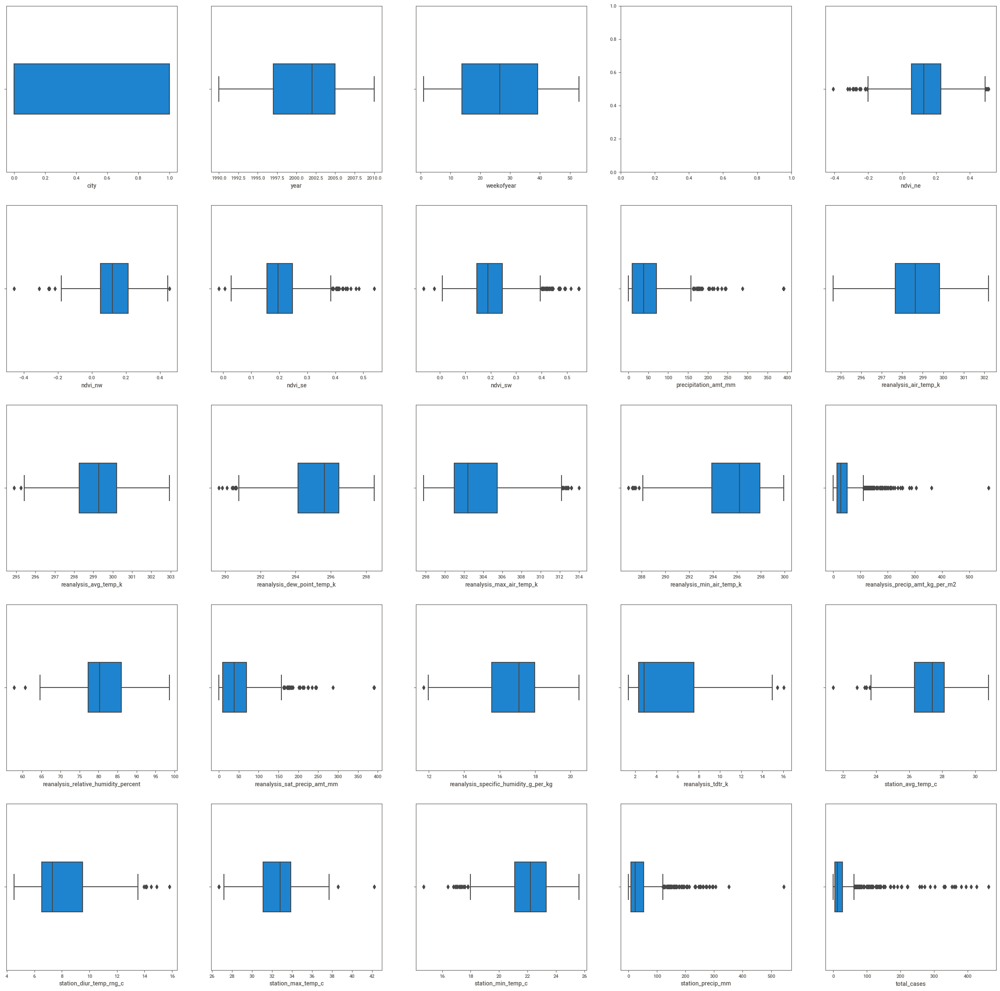

In [ ]:
#boxplot matrix
fig, axes = plt.subplots(5,5, figsize=(30, 30)) # create figure and axes

for i,el in enumerate(list(df.columns)):
    if el == 'week_start_date':
      continue
    ax = axes.flatten()[i]
    sns.boxplot(x=el,data=df,width=0.3,ax=ax)

plt.show()

From the above box plot matrix, we see that 20 out of the 25 box plots show outliers. "Total_cases" is the target variable and will not have any outliers dropped. Most of the plots show more than seven outliers, and these outliers are most likely not due to errors when recording the data. To avoid skewing the first linear regression prediciton we will try standardizing the variables with more than seven outliers. Those with less than seven outliers will be dropped and assumed that they were recorded by error. We will also incorporate other models such as random forest that will more easily handle outliers, and we can keep them in the data to see which model gives the best accuracy. 

In [ ]:
#calculting the z score, removing outliers that are more than 3 standard deviations from the mean
outlier_variables = ['ndvi_ne','ndvi_nw','reanalysis_avg_temp_k', 'reanalysis_max_air_temp_k'
,'reanalysis_min_air_temp_k','reanalysis_relative_humidity_percent','reanalysis_specific_humidity_g_per_kg'
,'reanalysis_tdtr_k','station_avg_temp_c','station_diur_temp_rng_c','station_max_temp_c']
z_scores = zscore(df[outlier_variables])
abs_z_scores = np.abs(z_scores)
filtered_entries = (abs_z_scores < 3).all(axis=1)
new_df = df[filtered_entries]


In [ ]:
new_df.shape

(1423, 25)

In [ ]:
#stad scaling
from sklearn.preprocessing import StandardScaler
trans_df = new_df
scaler = StandardScaler()
trans_df[outlier_variables] = scaler.fit_transform(new_df[outlier_variables])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value[:, i].tolist())


In [ ]:
trans_df[outlier_variables]

,ndvi_ne,ndvi_nw,reanalysis_avg_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_relative_humidity_percent,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c
0,-0.149258,-0.236646,-1.214027,-1.131498,0.045637,-1.264945,-1.837413,-0.632519,-1.414499,-0.537078,-1.608021
1,0.225219,0.099232,-0.644863,-0.783377,0.246444,-0.695986,-0.937184,-0.706626,-0.394674,-0.794758,-0.394814
2,-0.864563,0.368211,-0.290588,-0.909966,0.607897,-0.030169,0.039640,-0.727212,-0.394674,-0.739043,-0.131073
3,-0.101492,0.998036,-0.006006,-0.625140,0.487413,-0.274038,-0.076671,-0.690158,0.212638,-0.599757,0.449156
4,0.433437,1.147703,0.348270,-0.466904,0.688220,-0.256575,0.278882,-0.521357,1.392885,0.667748,1.345874
...,...,...,...,...,...,...,...,...,...,...,...
1451,1.593681,1.643002,1.248478,2.001588,-0.516624,0.923985,1.123320,1.434260,1.144613,1.916681,1.556867
1452,0.148084,0.258185,0.127574,1.621820,-1.560822,1.326845,0.848144,0.763175,0.182081,1.217928,1.187630
1453,0.836076,0.133144,-1.335991,0.672400,-1.360015,1.707776,0.145550,0.771409,-2.250985,-0.537078,-0.131073
1454,1.523728,1.004192,-1.394069,0.862284,-1.560822,1.761788,0.017891,0.878453,-1.422138,0.356675,-0.658555


Above, we have standardized the variables that had outliers removed. Variables such as "reanalysis_max_air_temp_k" were on a much larger scale with a mean of (303.43) compared to that of the vegetation indices. Standardizing the variables now makes them more comparable and will make them less susecptible to skewing prediction results. 

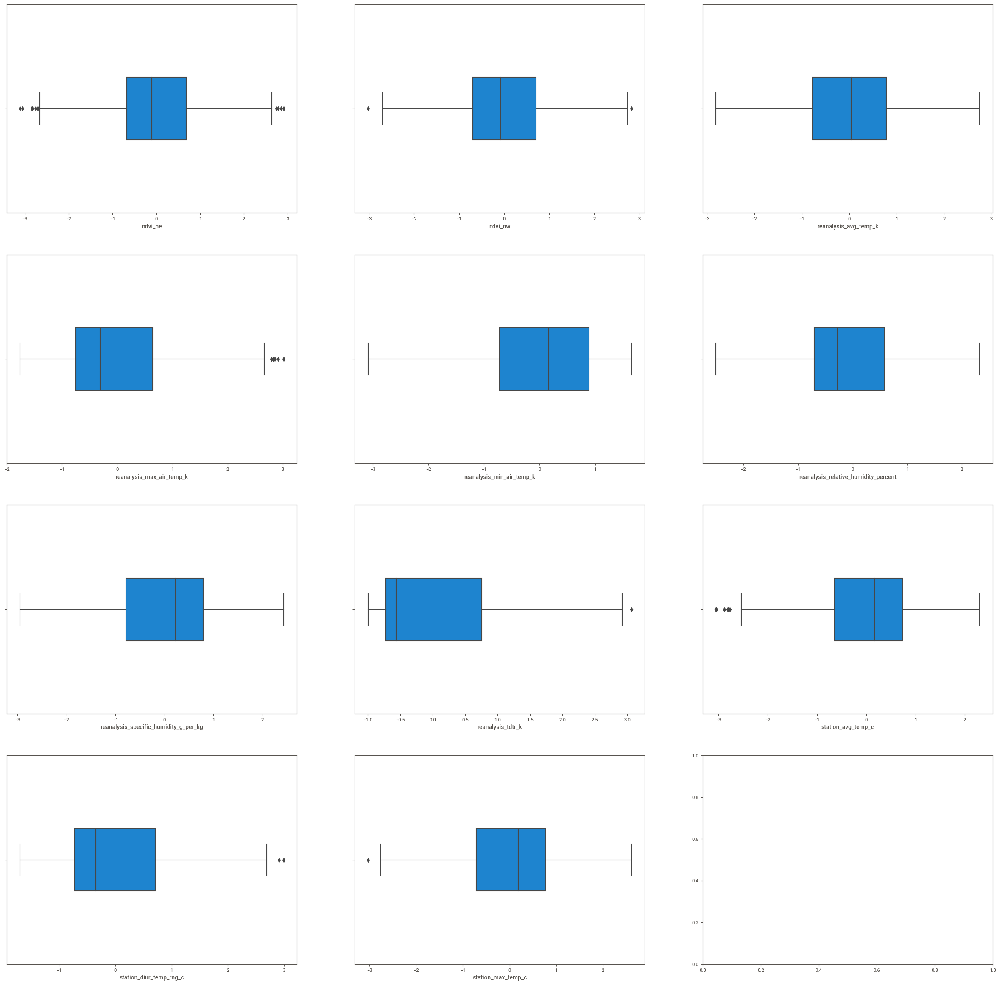

In [ ]:
#boxplot after removing outlier
fig, axes = plt.subplots(4,3, figsize=(30, 30)) # create figure and axes

for i,el in enumerate(list(outlier_variables)):
    if el == 'week_start_date':
      continue
    ax = axes.flatten()[i]
    sns.boxplot(x=el,data=trans_df,width=0.3,ax=ax)

plt.show()

We have plotted a new box plot matrix for the standardized variables. We can see that each of them no show less outliers than before, after they each had outliers that were 3 or more standard deviations away dropped. A few variables like "station_diur_temp_rng_c" and "station_max_temp_c" still show some outlier behavior. After running a regression these variables may need to be log transformed to handle the continued outlier influence on the prediction.  

In [ ]:
#getting correlation matrix
corr = trans_df.corr()
corr

,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
city,1.000000,-0.551265,0.009217,-0.709099,-0.688999,-0.470289,-0.576480,-0.316401,0.465149,0.060869,-0.139302,-0.840745,0.830632,-0.307242,-0.699332,-0.316401,-0.186949,-0.901352,-0.190862,-0.818129,-0.577508,0.422645,-0.352741,0.291847
year,-0.551265,1.000000,-0.069893,0.226798,0.154095,0.230816,0.275410,0.211250,-0.136574,0.094064,0.148753,0.487424,-0.391406,0.139192,0.348819,0.211250,0.177453,0.494493,0.058532,0.368281,0.234423,-0.208143,0.218634,-0.303829
weekofyear,0.009217,-0.069893,1.000000,0.038611,0.041848,0.115232,0.063041,0.117197,0.419061,0.457263,0.355199,0.224407,0.187551,0.073876,-0.010573,0.117197,0.355307,0.064380,0.359503,0.008140,0.222317,0.292454,0.064053,0.219011
ndvi_ne,-0.709099,0.226798,0.038611,1.000000,0.818041,0.600005,0.656272,0.189899,-0.345661,-0.049711,0.064090,0.619945,-0.620539,0.197387,0.477083,0.189899,0.099706,0.665348,0.169085,0.625432,0.455509,-0.307232,0.230877,-0.173065
ndvi_nw,-0.688999,0.154095,0.041848,0.818041,1.000000,0.566472,0.657101,0.186434,-0.331345,-0.042635,0.074696,0.606357,-0.597685,0.195936,0.473025,0.186434,0.110959,0.645461,0.195803,0.628161,0.478369,-0.301454,0.219468,-0.148580
ndvi_se,-0.470289,0.230816,0.115232,0.600005,0.566472,1.000000,0.819115,0.079538,-0.168062,0.043606,0.019448,0.464376,-0.412620,0.041955,0.240521,0.079538,0.044537,0.483166,0.093738,0.436105,0.291080,-0.251252,0.122924,-0.122990
ndvi_sw,-0.576480,0.275410,0.063041,0.656272,0.657101,0.819115,1.000000,0.129622,-0.240684,0.012063,0.039420,0.544537,-0.501526,0.110594,0.341242,0.129622,0.071013,0.567261,0.125564,0.528667,0.374081,-0.292129,0.154210,-0.145977
precipitation_amt_mm,-0.316401,0.211250,0.117197,0.189899,0.186434,0.079538,0.129622,1.000000,-0.020488,0.104718,0.431575,0.288965,-0.127031,0.478158,0.497994,1.000000,0.447214,0.209025,0.218258,0.192720,0.294024,0.071911,0.483594,-0.042389
reanalysis_air_temp_k,0.465149,-0.136574,0.419061,-0.345661,-0.331345,-0.168062,-0.240684,-0.020488,1.000000,0.899111,0.535277,-0.018459,0.745681,-0.133485,-0.407152,-0.020488,0.511395,-0.298663,0.604227,-0.272481,0.213535,0.723480,-0.178693,0.266302
reanalysis_avg_temp_k,0.060869,0.094064,0.457263,-0.049711,-0.042635,0.043606,0.012063,0.104718,0.899111,1.000000,0.631629,0.389348,0.438370,-0.033653,-0.159946,0.104718,0.627163,0.112900,0.742070,0.091414,0.501652,0.586094,-0.053577,0.153157


A correlation table was created to look for multicollinearity amongst the variables. 

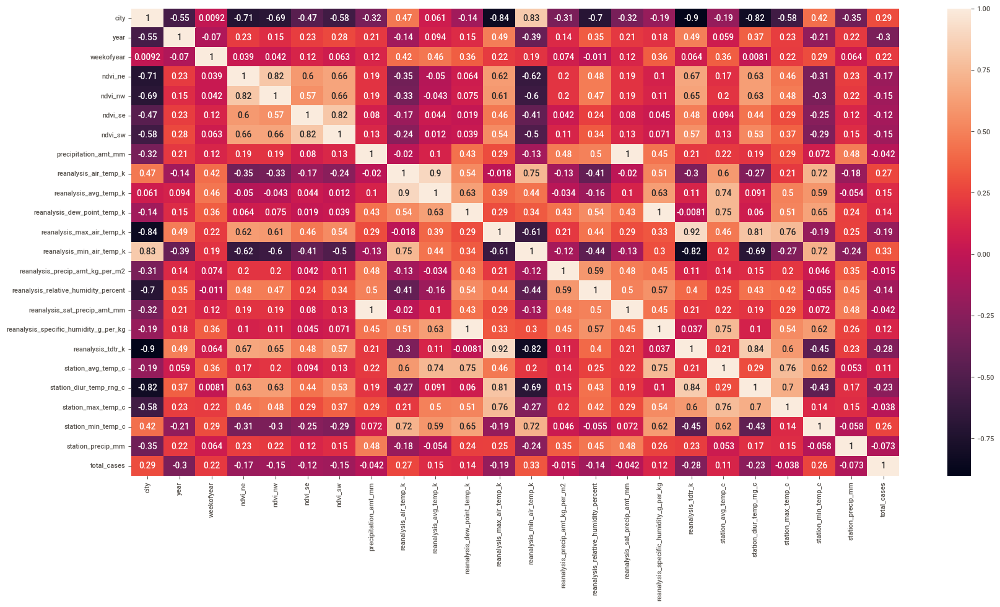

In [ ]:
#plotting heat map
ax, fig = plt.subplots(figsize=[20,10])
sns.heatmap(corr, annot=True)


A heat map of the correlation matrix was generated. The lighter the color, the more positively correlated it is with a variable and vice-versa. This map makes it easier to spot multicollinearity. Here, there are many variables that might influence one another. For example, the satellite vegetation indices "ndvi" all seem to influence each other somewhat. The southeast centroid is 0.82 correlated with the southwest centroid. It may be best to keep only one southeast centroid. After running a regression and looking at VIF scores to confirm their influence on each other, one can be dropped from the model.

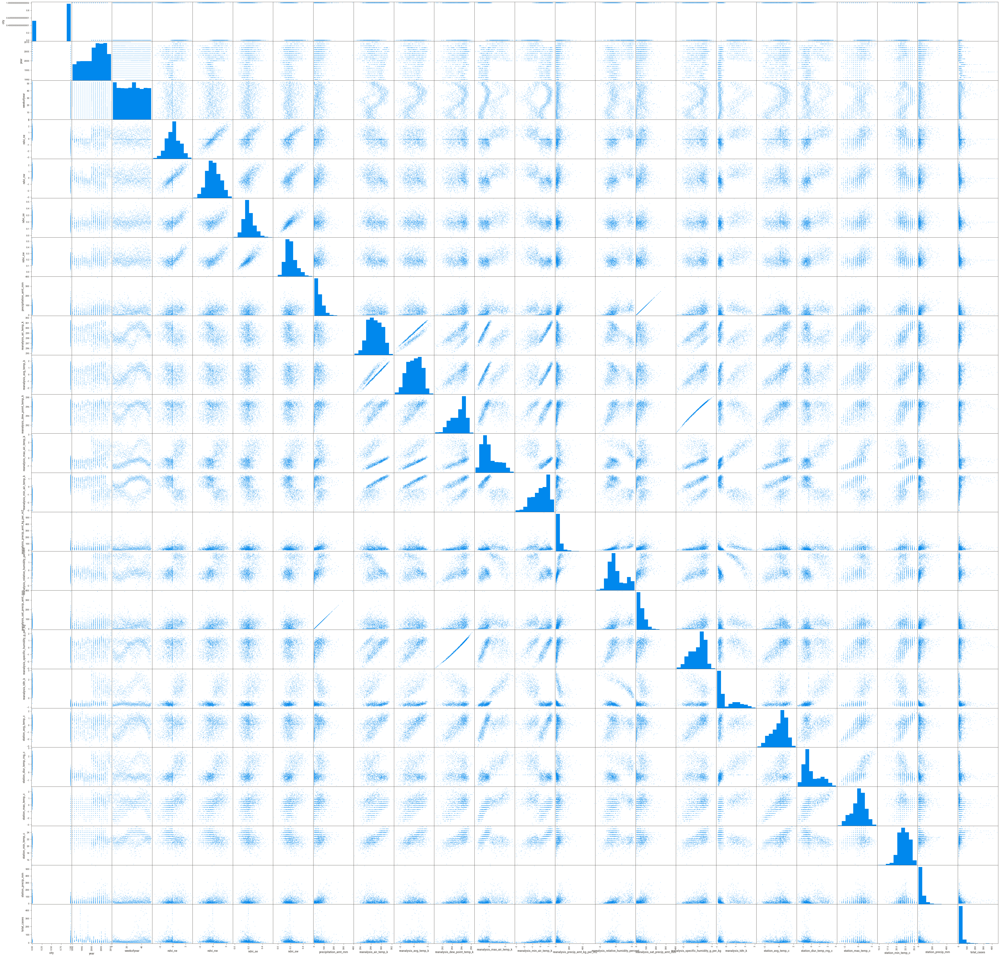

In [ ]:
#plotting scatter matrix
scatter_matrix(trans_df,figsize=(60,60))
plt.show()

From the revised scatter plot matrix, we see several variables that are positively correlated with the total case count. These variables are: weekofyear, reanalysis_air_temp_k, reanalysis_avg_temp_k, reanalysis_dew_point_temp_k, reanalysis_min_air_temp_k, station_avg_temp_c, and station_min_temp_c. When holding each other variable equal, these variables will produce a larger amount of dengue cases. It is interesting to note that more total cases occur as it gets later in the year. This coincides with the rainy season in both cities. We can also see that typically as the air temperature, dew point, and humidity increase the more cases that arrise.  

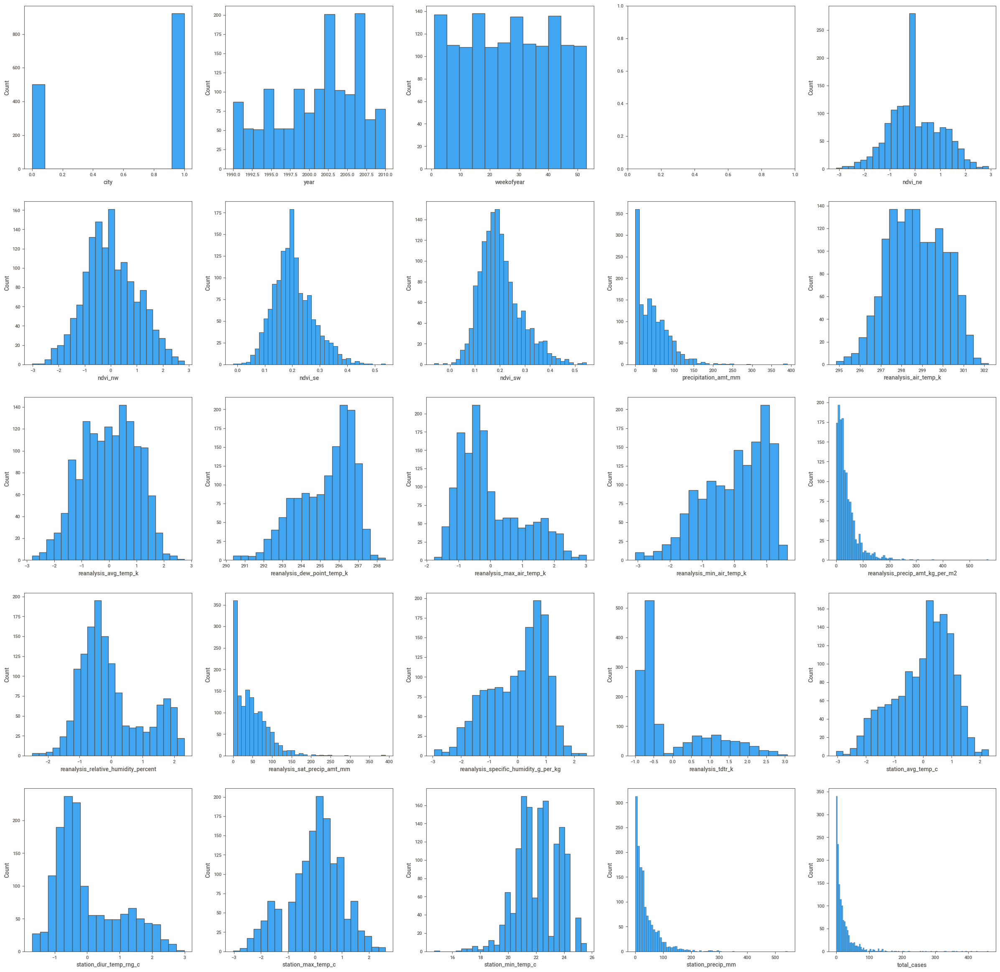

In [ ]:
#plotting histogram for all variable to check skewness
fig, axes = plt.subplots(5,5, figsize=(30, 30)) 
for i,el in enumerate(list(trans_df.columns)):
    if el == 'week_start_date':
      continue
    ax = axes.flatten()[i]

    sns.histplot(trans_df[el] ,ax=axes.flatten()[i])
  
plt.show()

We have plotted a histogram matrix above for all the numerical variables. This is after dropping outliers and standardizing those variables that had outliers dropped. There is still some left and right tail skewness ocurring in the distributions. For example, "reanalyis_dew_point_temp_k" is left tail skewed. This variable will most likly cause increasing case predictions if it is left as is. After running a regression, it can be transformed to account for the skewness. "Station_precip_mm" works in the opposite way as it is right tail skewed. It may also need to be transformed after running a regression and looking at the output coefficients. 

In [ ]:
# Create a mask for values above 90% 
# But also below 100% since it variables correlated with the same one
mask = (trans_df.corr() > 0.9) & (trans_df.corr() < 1.0)
high_corr_df = corr[mask]

In [ ]:
#any will return item if itterable are true
col_to_filter_out = ~high_corr_df[mask].any()


In [ ]:
#items which are false has high correlation,
col_to_filter_out

city                                      True
year                                      True
weekofyear                                True
ndvi_ne                                   True
ndvi_nw                                   True
ndvi_se                                   True
ndvi_sw                                   True
precipitation_amt_mm                      True
reanalysis_air_temp_k                     True
reanalysis_avg_temp_k                     True
reanalysis_dew_point_temp_k              False
reanalysis_max_air_temp_k                False
reanalysis_min_air_temp_k                 True
reanalysis_precip_amt_kg_per_m2           True
reanalysis_relative_humidity_percent      True
reanalysis_sat_precip_amt_mm              True
reanalysis_specific_humidity_g_per_kg    False
reanalysis_tdtr_k                        False
station_avg_temp_c                        True
station_diur_temp_rng_c                   True
station_max_temp_c                        True
station_min_t

A mask variable was created to find variables in the correlation matrix that would be the most correlated and interfere with prediction results. All boolean values for the variables are shown. Anything that has a correlation below 90% is listed as True and anything with above 90% is listed as False. The False columns can be dropped as they will most likely to be multicollinear. 

In [ ]:
X_clean = df[high_corr_df.columns[col_to_filter_out]]


In [ ]:
X_clean

,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
0,1,1990,18,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,297.742857,295.9,32.00,73.365714,12.42,25.442857,6.900000,29.4,20.0,16.0,4
1,1,1990,19,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,298.442857,296.4,17.94,77.368571,22.82,26.714286,6.371429,31.7,22.2,8.6,5
2,1,1990,20,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,298.878571,297.3,26.10,82.052857,34.54,26.714286,6.485714,32.2,22.8,41.4,4
3,1,1990,21,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,299.228571,297.0,13.90,80.337143,15.36,27.471429,6.771429,33.3,23.3,4.0,3
4,1,1990,22,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,299.664286,297.5,12.20,80.460000,7.52,28.942857,9.371429,35.0,23.9,5.8,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1451,0,2010,21,0.342750,0.318900,0.256343,0.292514,55.30,299.334286,300.771429,294.5,45.00,88.765714,55.30,28.633333,11.933333,35.4,22.4,27.0,5
1452,0,2010,22,0.160157,0.160371,0.136043,0.225657,86.47,298.330000,299.392857,291.9,207.10,91.600000,86.47,27.433333,10.500000,34.7,21.7,36.6,8
1453,0,2010,23,0.247057,0.146057,0.250357,0.233714,58.94,296.598571,297.592857,292.4,50.60,94.280000,58.94,24.400000,6.900000,32.2,19.2,7.4,1
1454,0,2010,24,0.333914,0.245771,0.278886,0.325486,59.67,296.345714,297.521429,291.9,62.33,94.660000,59.67,25.433333,8.733333,31.2,21.0,16.0,1


New clean dataframe with variables that did not have correlation above 90% with another variable. 

In [ ]:
X_clean.shape

(1456, 20)

In [ ]:
!pip install sweetviz


In [ ]:
#getting report consisting association graph
import sweetviz as sv
my_report = sv.analyze(trans_df)
my_report.show_html()

                                             |          | [  0%]   00:00 -> (? left)

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


From the sweetviz page we can view the association plot. The squares are listed to depict how much one variable can imply another variable will occur. For example, the "city" variable will provide the vegetation index "ndvi" and the direction variables for it. A blue value is a positive implication, while a red value is negative. The circles show correlation coefficients like the heat map above. This gives another overview of multicollinearity that might occur when making predictions. 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


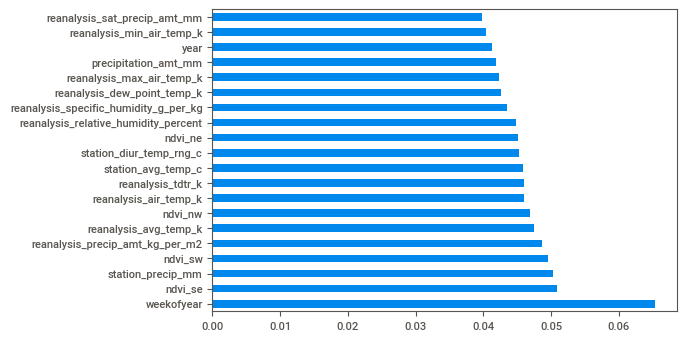

In [ ]:
#getting the feature importance, 
#using random forest model to know which feature has greater impact on dependent variable
from sklearn.ensemble import RandomForestClassifier
trans_df.dropna(axis=0,how='any',inplace=True)
X = trans_df.drop(["total_cases","week_start_date"] , axis=1)
#X['DAY_DELTA'] = (X.TIMESTAMP - X.TIMESTAMP.min()).dt.days

y = trans_df['week_start_date']
model = RandomForestClassifier()
model.fit(X, y)

(pd.Series(model.feature_importances_, index=X.columns)
   .nlargest(20)
   .plot(kind='barh'))

We have run a random forest model above which lists the feature importance for each remaining varaible in the data set in descending order. "Weekofyear" is shown as the best overall feature. When running our regression prediction, we can use this to create a threshold value. Any feature with less than 0.045 importance can be thrown out, and the remaining features can be kept. In this case, starting with "reanalysis_specific_humidity_g_per_kg" and below can be dropped before runnning a regression. 

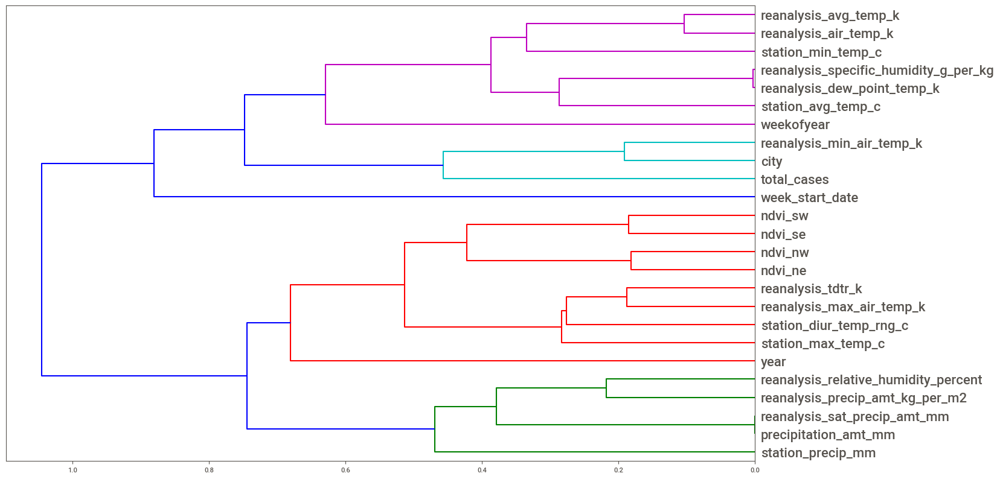

In [ ]:
#correlation and heirarchical clustering using dendogram for all variable
corr = np.round(scipy.stats.spearmanr(trans_df).correlation, 4)
corr_condensed = sch.distance.squareform(1-corr)
z = sch.linkage(corr_condensed, method='average')
fig = plt.figure(figsize=(16,10))
dendrogram = sch.dendrogram(z, labels=trans_df.columns, orientation='left', leaf_font_size=16)
plt.show()

The dendrogram above gives a visual on each feature, and depicts clustering relationship based on how related they are to other features. Again, we can view the correlation of the variables and see that variable such as "ndvi" and its directions are all quite correlated with two clusters next to each other. After running a prediction model, only one may need to be kept to best model a case of dengue. 

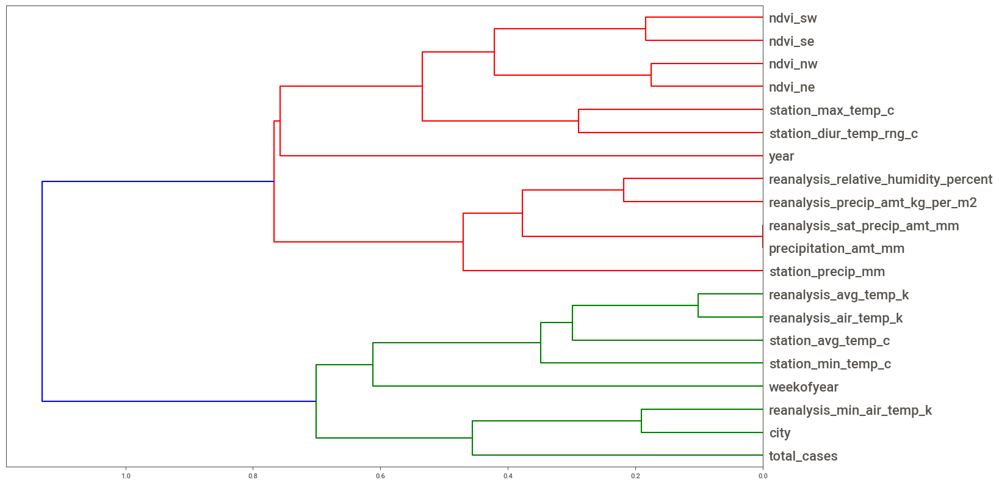

In [ ]:
#correlation and heirarchical clustering using dendogram for variables after dropping those that had correlation between 0.9 and 1
corr = np.round(scipy.stats.spearmanr(X_clean).correlation, 4)
corr_condensed = sch.distance.squareform(1-corr)
z = sch.linkage(corr_condensed, method='average')
fig = plt.figure(figsize=(16,10))
dendrogram = sch.dendrogram(z, labels=X_clean.columns, orientation='left', leaf_font_size=16)
plt.show()

Lastly, this is a dendrogram depicting the most closley correlated varibles - after dropping any variables that had a correlation coefficient greater than 0.90. For example, here variables "reanalysis_avg_temp_k" and "reanalysis_air_temp_k" have a high correlation. Therefore, only one may be needed in the final prediciton model. 